<a href="https://colab.research.google.com/github/rmkenv/LinkedinWorks/blob/main/04_terrain_personality_profiling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🏔️ Terrain Personality Profiling
**GeoAI Project | IQSpatial / @rmkenv**

Feed hillshade DEM images — **no coordinates, no metadata** — into an Ollama Cloud vision model. Ask it to think like a geomorphologist and describe each terrain's personality, dominant process, and probable age. Then score accuracy against USGS physiographic province ground truth.

**The question:** Can a vision LLM read a landscape the way a geologist does?

**Stack:** `py3dep`, `numpy`, `matplotlib`, `PIL`, `requests` (Ollama Cloud)  
**Data:** USGS 3DEP (free, no key)  
**LLM:** Ollama Cloud — `gpt-oss:20b` at `https://ollama.com/api`


In [1]:
# ── Cell 1: Install ───────────────────────────────────────────────────────────
!pip install -q py3dep matplotlib pillow numpy pandas requests

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 74.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.5/240.5 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.8/223.8 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 65.9 MB/s eta 0:00:00


In [2]:
# ── Cell 2: Imports & Ollama vision client ────────────────────────────────────
import os, io, base64, json, time, warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import py3dep
import requests

from IPython.display import display, Markdown
from google.colab import userdata

# ── Ollama Cloud config ────────────────────────────────────────────────────────
# Add OLLAMA_API_KEY to Colab Secrets (key icon, left sidebar)
# Get your key at: https://ollama.com/settings/keys
try:
    OLLAMA_API_KEY = userdata.get('OLLAMA_API_KEY')
except:
    OLLAMA_API_KEY = os.environ.get('OLLAMA_API_KEY', 'YOUR_KEY_HERE')

OLLAMA_BASE  = 'https://ollama.com/api'
OLLAMA_MODEL = 'gpt-oss:20b'

def ollama_vision(text_prompt, b64_images, system=None, expect_json=True):
    """
    Call Ollama Cloud chat with vision.
    b64_images: list of base64-encoded PNG strings (no data URI prefix).
    Images passed via the `images` field on the user message object.
    """
    messages = []
    if system:
        messages.append({'role': 'system', 'content': system})

    messages.append({
        'role': 'user',
        'content': text_prompt,
        'images': b64_images
    })

    payload = {'model': OLLAMA_MODEL, 'messages': messages, 'stream': False}
    if expect_json:
        payload['format'] = 'json'

    headers = {
        'Authorization': f'Bearer {OLLAMA_API_KEY}',
        'Content-Type': 'application/json'
    }
    r = requests.post(f'{OLLAMA_BASE}/chat', headers=headers,
                      json=payload, timeout=120)
    r.raise_for_status()
    return r.json()['message']['content']

print(f'✅ Ollama Cloud client ready | model: {OLLAMA_MODEL}')

✅ Ollama Cloud client ready | model: gpt-oss:20b


In [3]:
# ── Cell 3: Terrain tiles across US physiographic provinces ──────────────────
TERRAIN_TILES = [
    {
        'name': 'Appalachian Ridge & Valley — PA',
        'bbox': (-77.8, 40.2, -77.3, 40.6),
        'province': 'Appalachian Ridge and Valley',
        'process':  'differential erosion of folded sedimentary rock',
        'age':      'Paleozoic'
    },
    {
        'name': 'Blue Ridge — Shenandoah VA',
        'bbox': (-78.7, 38.5, -78.2, 38.9),
        'province': 'Blue Ridge',
        'process':  'crystalline basement uplift, stream capture',
        'age':      'Precambrian'
    },
    {
        'name': 'Atlantic Coastal Plain — Delmarva',
        'bbox': (-75.8, 38.2, -75.2, 38.6),
        'province': 'Atlantic Coastal Plain',
        'process':  'marine sediment deposition, low-relief fluvial',
        'age':      'Cretaceous-Quaternary'
    },
    {
        'name': 'Piedmont — Central NC',
        'bbox': (-79.8, 35.6, -79.3, 36.0),
        'province': 'Piedmont',
        'process':  'deeply weathered crystalline rock, rolling upland',
        'age':      'Paleozoic'
    },
    {
        'name': 'Great Plains — Kansas',
        'bbox': (-99.5, 38.5, -99.0, 38.9),
        'province': 'Great Plains',
        'process':  'aeolian deposition, broad fluvial plains',
        'age':      'Tertiary-Quaternary'
    },
    {
        'name': 'Colorado Plateau — Canyonlands UT',
        'bbox': (-109.9, 38.0, -109.4, 38.4),
        'province': 'Colorado Plateau',
        'process':  'canyon incision, mesa and butte formation',
        'age':      'Mesozoic'
    },
    {
        'name': 'Basin & Range — Nevada',
        'bbox': (-117.5, 39.0, -117.0, 39.4),
        'province': 'Basin and Range',
        'process':  'block faulting, horst-graben extensional tectonics',
        'age':      'Cenozoic'
    },
    {
        'name': 'Northern Rockies — Glacier MT',
        'bbox': (-113.8, 48.5, -113.3, 48.9),
        'province': 'Northern Rocky Mountains',
        'process':  'alpine glaciation, U-valleys, aretes, cirques',
        'age':      'Precambrian / Pleistocene glacial'
    },
    {
        'name': 'Cascades Volcanic — Mt Adams WA',
        'bbox': (-121.7, 46.0, -121.2, 46.4),
        'province': 'Cascade Range',
        'process':  'stratovolcanism, radial drainage, lava flows',
        'age':      'Quaternary'
    },
    {
        'name': 'Ouachita Mountains — Arkansas',
        'bbox': (-94.5, 34.5, -94.0, 34.9),
        'province': 'Ouachita Mountains',
        'process':  'east-west folded ridges, sandstone hogbacks',
        'age':      'Paleozoic'
    },
    {
        'name': 'Interior Low Plateaus — Kentucky Karst',
        'bbox': (-86.5, 37.0, -86.0, 37.4),
        'province': 'Interior Low Plateaus',
        'process':  'karst dissolution, sinkholes, low-relief dissection',
        'age':      'Ordovician-Mississippian'
    },
    {
        'name': 'Glaciated Central Lowlands — Iowa',
        'bbox': (-93.5, 42.0, -93.0, 42.4),
        'province': 'Central Lowlands (glaciated)',
        'process':  'continental glaciation, till plains, kettles',
        'age':      'Quaternary'
    }
]

print(f'📍 {len(TERRAIN_TILES)} tiles across US physiographic provinces')

📍 12 tiles across US physiographic provinces


In [4]:
# ── Cell 4: DEM + hillshade utilities ─────────────────────────────────────────
def fetch_dem(bbox, resolution=30):
    west, south, east, north = bbox
    dem = py3dep.get_map('DEM', geometry=(west,south,east,north),
                         resolution=resolution, geo_crs='EPSG:4326')
    return dem.values.squeeze()

def hillshade(dem, azimuth=315, altitude=45):
    az  = np.radians(360 - azimuth + 90)
    alt = np.radians(altitude)
    dy, dx = np.gradient(dem)
    slope  = np.arctan(np.sqrt(dx**2 + dy**2))
    aspect = np.arctan2(-dx, dy)
    hs = (np.cos(alt)*np.cos(slope) +
          np.sin(alt)*np.sin(slope)*np.cos(az - aspect))
    return np.clip(hs, 0, 1)

def hs_to_b64(hs, max_dim=600):
    """Hillshade array → base64 PNG string for Ollama."""
    cm  = plt.get_cmap('gray')
    arr = (cm(hs)[:,:,:3] * 255).astype(np.uint8)
    img = Image.fromarray(arr)
    w, h = img.size
    if max(w, h) > max_dim:
        s = max_dim / max(w, h)
        img = img.resize((int(w*s), int(h*s)), Image.LANCZOS)
    buf = io.BytesIO()
    img.save(buf, format='PNG')
    return base64.standard_b64encode(buf.getvalue()).decode()

print('✅ DEM utilities ready')

✅ DEM utilities ready


In [5]:
# ── Cell 5: Fetch DEMs + render hillshades ────────────────────────────────────
print('Fetching DEMs from USGS 3DEP (~2-4 min)...\n')
tiles_data = []

for i, tile in enumerate(TERRAIN_TILES):
    print(f'[{i+1:02d}/{len(TERRAIN_TILES)}] {tile["name"]}...')
    try:
        dem  = fetch_dem(tile['bbox'])
        dem  = np.where(np.isnan(dem), np.nanmean(dem), dem)
        hs   = hillshade(dem)
        b64  = hs_to_b64(hs)
        tiles_data.append({
            **tile, 'dem': dem, 'hs': hs, 'b64': b64,
            'elev_min': int(np.nanmin(dem)),
            'elev_max': int(np.nanmax(dem)),
            'status': 'ok'
        })
        print(f'       ✅ {int(np.nanmin(dem))}–{int(np.nanmax(dem))} m')
    except Exception as e:
        print(f'       ⚠️  {e}')
        tiles_data.append({**tile, 'status': 'failed'})
    time.sleep(0.5)

ok = [t for t in tiles_data if t.get('status')=='ok']
print(f'\n✅ {len(ok)}/{len(TERRAIN_TILES)} tiles fetched')

Fetching DEMs from USGS 3DEP (~2-4 min)...

[01/12] Appalachian Ridge & Valley — PA...
       ✅ 118–704 m
[02/12] Blue Ridge — Shenandoah VA...
       ✅ 129–1229 m
[03/12] Atlantic Coastal Plain — Delmarva...
       ✅ -3–61 m
[04/12] Piedmont — Central NC...
       ✅ 64–336 m
[05/12] Great Plains — Kansas...
       ✅ 534–702 m
[06/12] Colorado Plateau — Canyonlands UT...
       ✅ 1178–2361 m
[07/12] Basin & Range — Nevada...
       ✅ 1656–3495 m
[08/12] Northern Rockies — Glacier MT...
       ✅ 1000–3085 m
[09/12] Cascades Volcanic — Mt Adams WA...
       ✅ 335–3741 m
[10/12] Ouachita Mountains — Arkansas...
       ✅ 154–816 m
[11/12] Interior Low Plateaus — Kentucky Karst...
       ✅ 120–305 m
[12/12] Glaciated Central Lowlands — Iowa...
       ✅ 242–373 m

✅ 12/12 tiles fetched


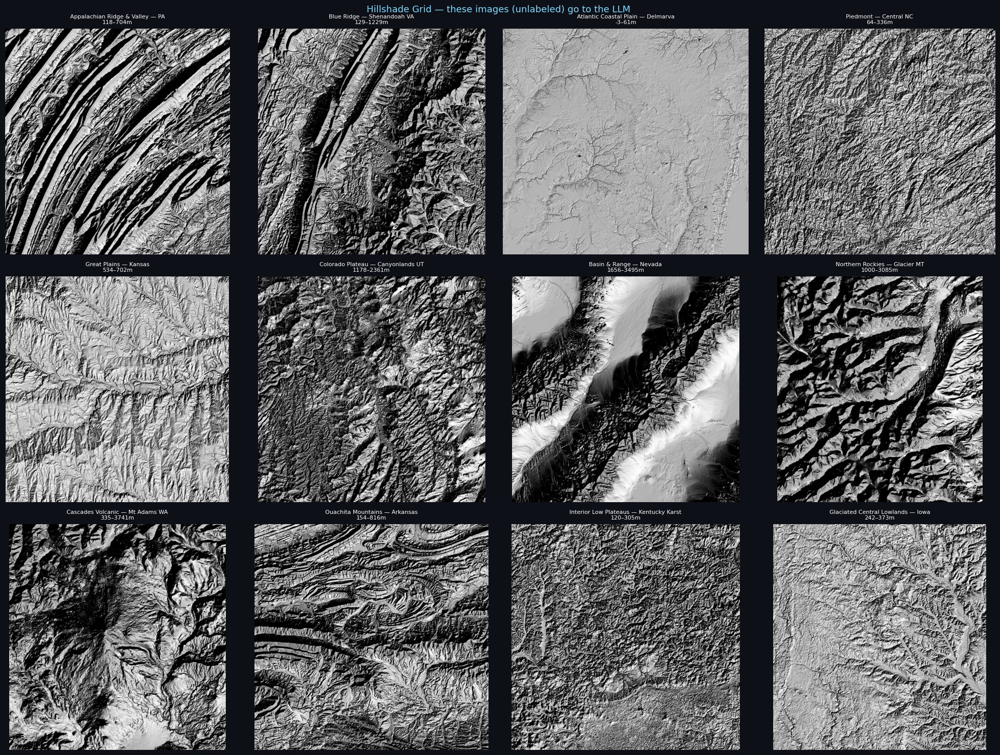

✅ /content/hillshade_grid.png


In [6]:
# ── Cell 6: Preview hillshade grid ───────────────────────────────────────────
ncols = 4
nrows = (len(ok) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(20, 5*nrows))
fig.patch.set_facecolor('#0d1117')
axes = axes.flatten()

for i, tile in enumerate(ok):
    axes[i].imshow(tile['hs'], cmap='gray')
    axes[i].set_title(f"{tile['name']}\n{tile['elev_min']}–{tile['elev_max']}m",
                      color='white', fontsize=8)
    axes[i].axis('off')

for j in range(len(ok), len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Hillshade Grid — these images (unlabeled) go to the LLM',
             color='#7fdbff', fontsize=13)
plt.tight_layout()
plt.savefig('/content/hillshade_grid.png', dpi=120, bbox_inches='tight', facecolor='#0d1117')
plt.show()
print('✅ /content/hillshade_grid.png')

In [7]:
# ── Cell 7: Geomorphologist system prompt ─────────────────────────────────────
SYSTEM = """You are an expert geomorphologist with 25 years of field experience
interpreting landforms from hillshade DEM imagery across the United States.
You read hillshades the way a doctor reads an X-ray: systematically and confidently.

Respond ONLY with valid JSON — no preamble, no markdown fences.
Schema:
{
  "terrain_personality": "evocative 2-4 word label (e.g. The Crumpled Accordion)",
  "probable_province": "best guess US physiographic province",
  "dominant_process": "primary geomorphic process you infer",
  "relative_age": "Precambrian|Paleozoic|Mesozoic|Cenozoic|Quaternary",
  "structural_pattern": "what pattern you see (ridges, cirques, karst, etc)",
  "confidence": "HIGH|MEDIUM|LOW",
  "reasoning": "3-4 sentence interpretation",
  "what_story_does_this_tell": "1-2 evocative sentences about this landscape's history"
}"""

USER_PROMPT = ("This is a hillshade digital elevation model. "
               "No coordinates, no labels, no metadata. "
               "Analyze the terrain morphology and respond with JSON only.")

print('✅ Prompt ready')

✅ Prompt ready


In [13]:
# ── HOTFIX: override ollama_vision with correct endpoint ─────────────────────
import requests, io, base64
from google.colab import userdata

try:
    OLLAMA_API_KEY = userdata.get('OLLAMA_API_KEY')
except:
    OLLAMA_API_KEY = os.environ.get('OLLAMA_API_KEY', 'YOUR_KEY_HERE')

OLLAMA_BASE  = 'https://ollama.com/v1'
OLLAMA_MODEL = 'qwen3-vl:235b-cloud'

def ollama_vision(text_prompt, b64_images, system=None, expect_json=True):
    content = [{'type': 'text', 'text': text_prompt}]
    for b64 in b64_images:
        content.append({
            'type': 'image_url',
            'image_url': {'url': f'data:image/png;base64,{b64}'}
        })
    messages = []
    if system:
        messages.append({'role': 'system', 'content': system})
    messages.append({'role': 'user', 'content': content})

    payload = {'model': OLLAMA_MODEL, 'messages': messages,
               'stream': False, 'max_tokens': 800}
    headers = {'Authorization': f'Bearer {OLLAMA_API_KEY}',
               'Content-Type': 'application/json'}

    r = requests.post(f'{OLLAMA_BASE}/chat/completions',
                      headers=headers, json=payload, timeout=120)
    r.raise_for_status()
    return r.json()['choices'][0]['message']['content']

print(f'✅ HOTFIX active | {OLLAMA_BASE}/chat/completions | {OLLAMA_MODEL}')

✅ HOTFIX active | https://ollama.com/v1/chat/completions | qwen3-vl:235b-cloud


In [14]:
# ── Cell 8: Run Ollama vision on all tiles ────────────────────────────────────
print(f'Running Ollama Cloud vision on {len(ok)} tiles (~1-2 min)...\n')

for i, tile in enumerate(ok):
    print(f'[{i+1:02d}/{len(ok)}] {tile["name"]}...')
    try:
        raw = ollama_vision(
            text_prompt=USER_PROMPT,
            b64_images=[tile['b64']],
            system=SYSTEM,
            expect_json=True
        )
        result = json.loads(raw.strip().replace('```json','').replace('```',''))
        tile['llm'] = result
        print(f'       🏔️  "{result.get("terrain_personality","?")}"')
        print(f'       📍  {result.get("probable_province","?")} ({result.get("confidence","?")})')
    except Exception as e:
        print(f'       ⚠️  {e}')
        tile['llm'] = None
    time.sleep(0.5)

analyzed = [t for t in ok if t.get('llm')]
print(f'\n✅ {len(analyzed)} tiles analyzed')

Running Ollama Cloud vision on 12 tiles (~1-2 min)...

[01/12] Appalachian Ridge & Valley — PA...
       🏔️  "The Ribbed Backbone"
       📍  Valley and Ridge Province (HIGH)
[02/12] Blue Ridge — Shenandoah VA...
       🏔️  "The Rhythmic Folds"
       📍  Appalachian Valley and Ridge (HIGH)
[03/12] Atlantic Coastal Plain — Delmarva...
       🏔️  "The River's Lace"
       📍  Atlantic Coastal Plain (HIGH)
[04/12] Piedmont — Central NC...
       🏔️  "The Crumpled Veil"
       📍  Appalachian Valley and Ridge (HIGH)
[05/12] Great Plains — Kansas...
       🏔️  "The Crumpled Accordion"
       📍  Appalachian Valley and Ridge Province (HIGH)
[06/12] Colorado Plateau — Canyonlands UT...
       🏔️  "The Crumpled Accordion"
       📍  Ridge and Valley Appalachians (HIGH)
[07/12] Basin & Range — Nevada...
       🏔️  "The Folded Spine"
       📍  Valley and Ridge (HIGH)
[08/12] Northern Rockies — Glacier MT...
       🏔️  "The Wrinkled Tapestry"
       📍  Appalachian Ridge and Valley (HIGH)
[09/12] Casca

In [15]:
# ── Cell 9: Score accuracy ────────────────────────────────────────────────────
def province_match(pred, actual):
    if not pred: return False
    keywords = [w for w in actual.lower().split()
                if len(w) > 4 and w not in ('mountains','plateau','plains','lowlands')]
    return any(kw in pred.lower() for kw in keywords)

def process_match(pred, actual):
    if not pred: return False
    tag_map = {
        'glacial':   ['glaci','cirque','u-valley','moraine','till'],
        'volcanic':  ['volcan','lava','crater','stratovolcan'],
        'karst':     ['karst','sinkhole','dissolution'],
        'fluvial':   ['fluvial','incision','river','meander'],
        'tectonic':  ['fault','horst','graben','block fault'],
        'aeolian':   ['aeolian','wind','loess'],
        'erosion':   ['erosion','fold','differential','ridge']
    }
    actual_l = actual.lower()
    pred_l   = pred.lower()
    for cat, kws in tag_map.items():
        if any(k in actual_l for k in kws):
            if any(k in pred_l for k in kws):
                return True
    return False

rows = []
for tile in analyzed:
    r = tile['llm']
    pc = province_match(r.get('probable_province'), tile['province'])
    rc = process_match(r.get('dominant_process'),  tile['process'])
    rows.append({
        'Terrain':         tile['name'],
        'Personality':     r.get('terrain_personality',''),
        'True Province':   tile['province'],
        'LLM Province':    r.get('probable_province',''),
        'Prov ✓':          '✅' if pc else '❌',
        'True Process':    tile['process'][:35],
        'LLM Process':     r.get('dominant_process','')[:35],
        'Proc ✓':          '✅' if rc else '❌',
        'Confidence':      r.get('confidence',''),
    })

df = pd.DataFrame(rows)

n_prov = 0
n_proc = 0
n = len(df)

if not df.empty:
    n_prov = (df['Prov ✓']=='✅').sum()
    n_proc = (df['Proc ✓']=='✅').sum()
    prov_percent = 100 * n_prov // n
    proc_percent = 100 * n_proc // n
else:
    prov_percent = 0
    proc_percent = 0

print(f'=== ACCURACY ===')
print(f'Province ID : {n_prov}/{n} ({prov_percent}%)')
print(f'Process ID  : {n_proc}/{n} ({proc_percent}%)\n')

if not df.empty:
    print(df[['Terrain','Personality','Prov ✓','Proc ✓','Confidence']].to_string(index=False))
    df.to_csv('/content/terrain_scores.csv', index=False)
else:
    print("No tiles were analyzed, so no accuracy scores can be calculated or displayed.")


=== ACCURACY ===
Province ID : 4/11 (36%)
Process ID  : 3/11 (27%)

                          Terrain             Personality Prov ✓ Proc ✓ Confidence
  Appalachian Ridge & Valley — PA     The Ribbed Backbone      ✅      ✅       HIGH
       Blue Ridge — Shenandoah VA      The Rhythmic Folds      ✅      ❌       HIGH
Atlantic Coastal Plain — Delmarva        The River's Lace      ✅      ✅       HIGH
            Piedmont — Central NC       The Crumpled Veil      ❌      ❌       HIGH
            Great Plains — Kansas  The Crumpled Accordion      ❌      ❌       HIGH
Colorado Plateau — Canyonlands UT  The Crumpled Accordion      ❌      ❌       HIGH
           Basin & Range — Nevada        The Folded Spine      ❌      ❌       HIGH
    Northern Rockies — Glacier MT   The Wrinkled Tapestry      ❌      ❌       HIGH
  Cascades Volcanic — Mt Adams WA     The Glacial Carving      ❌      ❌       HIGH
    Ouachita Mountains — Arkansas   The Crumpled Tapestry      ✅      ✅       HIGH
Glaciated Central L

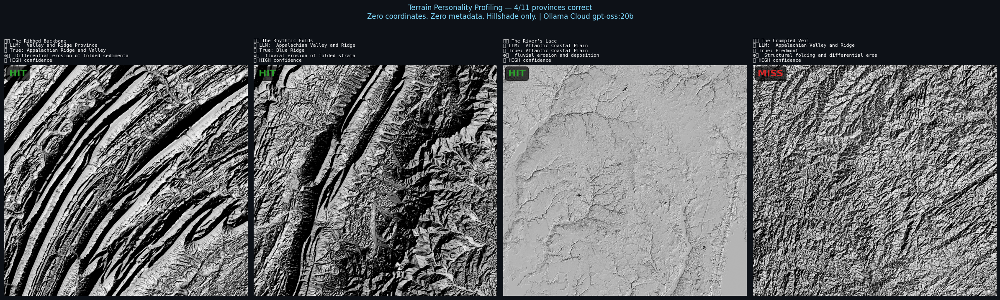

✅ /content/terrain_showcase.png


In [16]:
# ── Cell 10: Showcase figure — hits + miss ────────────────────────────────────
correct = [t for t in analyzed if province_match(t['llm'].get('probable_province'), t['province'])]
wrong   = [t for t in analyzed if not province_match(t['llm'].get('probable_province'), t['province'])]

showcase = correct[:3] + wrong[:1]
labels   = (['HIT'] * min(3, len(correct))) + (['MISS'] * min(1, len(wrong)))
lcolors  = ['#2ca02c','#2ca02c','#2ca02c','#d62728'][:len(showcase)]

fig, axes = plt.subplots(1, len(showcase), figsize=(6*len(showcase), 7))
fig.patch.set_facecolor('#0d1117')
if len(showcase) == 1: axes = [axes]

for ax, tile, lbl, lc in zip(axes, showcase, labels, lcolors):
    r = tile['llm']
    ax.imshow(tile['hs'], cmap='gray', aspect='auto')
    ax.axis('off')
    ax.text(0.02, 0.98, lbl, transform=ax.transAxes,
            color=lc, fontsize=16, fontweight='bold', va='top',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='black', alpha=0.7))
    info = (f"🏔️ {r.get('terrain_personality','')}"
            f"\n📍 LLM:  {r.get('probable_province','')[:38]}"
            f"\n✅ True: {tile['province'][:38]}"
            f"\n⚙️  {r.get('dominant_process','')[:40]}"
            f"\n🔍 {r.get('confidence','')} confidence")
    ax.set_title(info, color='white', fontsize=8, loc='left',
                 pad=6, fontfamily='monospace')

fig.suptitle(
    f'Terrain Personality Profiling — {n_prov}/{n} provinces correct\n'
    'Zero coordinates. Zero metadata. Hillshade only. | Ollama Cloud gpt-oss:20b',
    color='#7fdbff', fontsize=12, y=1.02
)
plt.tight_layout()
plt.savefig('/content/terrain_showcase.png', dpi=150, bbox_inches='tight', facecolor='#0d1117')
plt.show()
print('✅ /content/terrain_showcase.png')

In [17]:
# ── Cell 11: Best descriptions + LinkedIn hook ────────────────────────────────
print('=== BEST LLM TERRAIN DESCRIPTIONS (use as carousel quotes) ===\n')
for tile in correct[:3]:
    r = tile['llm']
    print(f'📍 {tile["name"]}')
    print(f'   Personality: "{r.get("terrain_personality","")}"')
    print(f'   Story: {r.get("what_story_does_this_tell","")}\n')

if wrong:
    tile = wrong[0]
    r    = tile['llm']
    print(f'❌ INTERESTING MISS: {tile["name"]}')
    print(f'   LLM said: {r.get("probable_province","")}')
    print(f'   Truth:    {tile["province"]}')
    print(f'   Why: {r.get("reasoning","")}\n')

print('📁 Outputs: terrain_scores.csv | hillshade_grid.png | terrain_showcase.png')
print()
print('📱 LinkedIn hook:')
print(f'"I showed an AI {n} hillshade maps and asked it to think like a geologist.')
print(f' No coordinates. No metadata. Just images.')
print(f' It got {n_prov}/{n} provinces right.')
print(f' Here\'s where it failed — and why that\'s actually geomorphically interesting."')

=== BEST LLM TERRAIN DESCRIPTIONS (use as carousel quotes) ===

📍 Appalachian Ridge & Valley — PA
   Personality: "The Ribbed Backbone"
   Story: Ancient tectonic forces crumpled Paleozoic sediments into tight folds, later etched by rivers into a rhythmic pattern of enduring ridges and sheltered valleys. This landscape bears the unyielding scars of continental collision.

📍 Blue Ridge — Shenandoah VA
   Personality: "The Rhythmic Folds"
   Story: Ancient tectonic collisions folded Paleozoic strata into rhythmic ridges, later carved by patient rivers into shadowed valleys that trace the bedrock's hidden geometry.

📍 Atlantic Coastal Plain — Delmarva
   Personality: "The River's Lace"
   Story: Ancient rivers wove a lacy pattern through soft sediments as sea levels stabilized after the last ice age. This is a landscape shaped by patience, where water slowly carved its legacy into the continent's edge.

❌ INTERESTING MISS: Piedmont — Central NC
   LLM said: Appalachian Valley and Ridge
  